## Importing libraries and settings

In [15]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
#import statsmodels.api as sm
import plotly
import plotly.plotly as py
import plotly.offline as pyoff
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from IPython.display import display, HTML

In [16]:
%matplotlib inline

sns.set(color_codes=True)
sns.set(style="whitegrid", palette="pastel", color_codes=True)

larger_dims = (20, 14)

# For Plotly
init_notebook_mode(connected=True)

<center><h1>UFO Sightings Analysis</h1></center>

<h1><u>Hypotheses:</u></h1>
<h3>H<sub>0</sub>: In 2020, the number of UFO reports will be
</h3>
<h3>H<sub>A</sub>: In 2020, the number of UFO reports will be
</h3>

<h3>Study:</h3>
<ul>
    <li>Are UFO reports associated with the number of departing flights</li>
</ul>

<h1><u>Background:</u></h1><br>

<p>Recently, there has been an uptrend in UFO sightings. They've even made the news: just several days ago, the Pentagon released reports that they had been conducting a report on UFO sightings for five years. We wanted to study these extraterrestrial phenomena to gain some insights into the growth of this vein of urban myth. </p>

<h1><u>Data Profile:</u></h1><br>

## UFO Reports
<ul>
<li>Obtained from <b>Kaggle</b>. Collected by <b>NUFORC</b>. Scraped, geolocated, and time standardized by Sigmond Axel - https://github.com/planetsig/ufo-reports.
<li>Contains UFO reports dating back to 1941 up to 2014. <b>A lot</b> of reports!</li>
<li>There was a "scrubbed" version so we didn't have to do much cleaning.</li>
<li>Each record is one sighting. It contains data like:
    <ul>
        <li>Latitude and Longitude</li>
        <li>Shape</li>
        <li>Duration of sighting</li>
        <li>Comments</li>
    </ul>
</li>
</ul>

## US Air Carrier Aircraft Departures
<ul>
    <li>Contains data on aircraft departures of different categories</li>
    <li>Dates from 1975-2014. Earlier reports had some skipped yearly reports</li>
    <li>Data contains yearly departures performed</li>
    <li>Since it was in "spreadsheet format," it was heavily cleaned and transposed</li>
</ul>

## US Domestic Passenger and Cargo Flight Departures
<ul>
    <li>Contains more specific data on aircraft departures</li>
    <li>Dates from October 2002 to September 2017</li>
    <li>Obtained from Bureau of Transportation Statistics</li>
    <li>Minimal cleaning required.
    <li>Contains data on period (month) and total departures performed during that period</li>
</ul>

<h1><u>Results</u></h1>

<b>Read CSVs</b>

In [8]:
ufos = pd.read_csv("data/ufo-sightings/scrubbed.csv", sep=',', low_memory=False)
flights = pd.read_csv("data/flights/flights.csv", sep=',', low_memory=False)
#airports = pd.read_csv("data/airports.csv", sep=',', low_memory=False)

<b>Clean and make usable</b>

In [9]:
ufos['dur_secs'] = pd.to_numeric(ufos['duration (seconds)'], errors="coerce")
ufos = ufos.drop('duration (seconds)', 1)
ufos['latitude'] = pd.to_numeric(ufos['latitude'], errors="coerce")
ufos['longitude'] = pd.to_numeric(ufos['longitude'], errors="coerce")
ufos.datetime = pd.to_datetime(ufos['datetime'], errors="coerce")

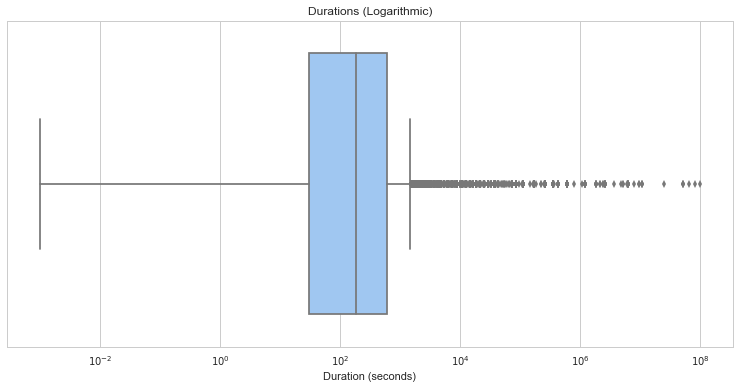

In [10]:
durations = pd.DataFrame(data=np.array(ufos.dur_secs))
fig, ax = plt.subplots()
ax.set(xscale="log")
fig.set_size_inches(13, 6)
plt.title('Durations (Logarithmic)')
plt.xlabel('Duration (seconds)')
pl = sns.boxplot(durations)

In [11]:
ufos.head()

,datetime,city,state,country,shape,duration (hours/min),comments,date posted,latitude,longitude,dur_secs
0,1949-10-10 20:30:00,san marcos,tx,us,cylinder,45 minutes,This event took place in early fall around 194...,4/27/2004,29.883056,-97.941111,2700.0
1,1949-10-10 21:00:00,lackland afb,tx,NaN,light,1-2 hrs,1949 Lackland AFB&#44 TX. Lights racing acros...,12/16/2005,29.384210,-98.581082,7200.0
2,1955-10-10 17:00:00,chester (uk/england),NaN,gb,circle,20 seconds,Green/Orange circular disc over Chester&#44 En...,1/21/2008,53.200000,-2.916667,20.0
3,1956-10-10 21:00:00,edna,tx,us,circle,1/2 hour,My older brother and twin sister were leaving ...,1/17/2004,28.978333,-96.645833,20.0
4,1960-10-10 20:00:00,kaneohe,hi,us,light,15 minutes,AS a Marine 1st Lt. flying an FJ4B fighter/att...,1/22/2004,21.418056,-157.803611,900.0


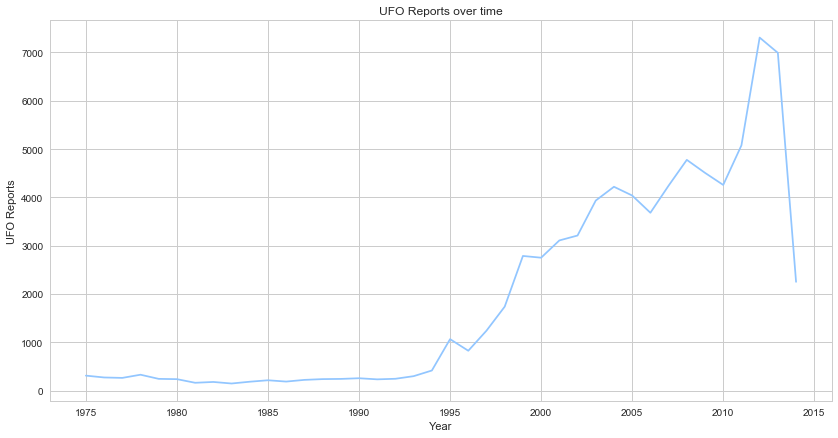

In [17]:
# Get UFO reports according to data

sample_ufos = ufos[ufos.datetime.dt.year >= 1975]
ufos_per_year = sample_ufos.groupby(by=sample_ufos.datetime.dt.year).size()
fig, ax = plt.subplots()
fig.set_size_inches(14, 7)
#plt.semilogy(y=ufos_per_year)
plt.ylabel('UFO Reports')
plt.xlabel('Year')
plt.title('UFO Reports over time')
plt.plot(ufos_per_year, 'b')

*Note: The line chart seems to nose dive in recent years because the UFO data only goes up to the middle of 2014.*

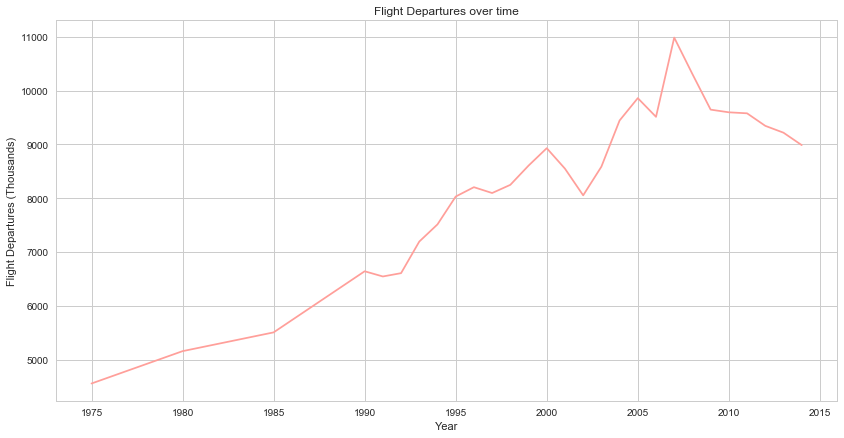

In [18]:
departs_by_year = pd.DataFrame(columns=['date', 'departs'])
departs_by_year.date = flights.Year
departs_by_year.departs = flights['Total performed'] / 1000
fig, ax = plt.subplots()
fig.set_size_inches(14, 7)
plt.ylabel('Flight Departures (Thousands)')
plt.xlabel('Year')
plt.title('Flight Departures over time')
plt.plot(departs_by_year.date, departs_by_year.departs, 'r')

In [19]:
ufos_sample_data = ufos[ufos.datetime.dt.year >= 1990]
ufos_sample_group_by = ufos_sample_data.groupby(by=ufos_sample_data.datetime.dt.year).count()
ufos_sample = ufos_sample_group_by['datetime']

ufos_departs_per_year = pd.DataFrame(columns=['year','ufos','departs'])
ufos_departs_per_year.year = departs_by_year[departs_by_year.date >= 1990]['date']
ufos_departs_per_year.ufos = ufos_sample.values
ufos_departs_per_year.departs = departs_by_year[departs_by_year.date >= 1990]['departs']

trace1 = go.Scatter(
    x=ufos_departs_per_year.year,
    y=ufos_departs_per_year.ufos,
    showlegend=False
)
trace2 = go.Scatter(
    x=ufos_departs_per_year.year,
    y=ufos_departs_per_year.departs,
    yaxis='y2',
    showlegend=False
)
data = [trace1, trace2]
layout = dict(
    title='UFO Reports/Flight Departures over time',
    yaxis=dict(
        title='UFO Reports'
    ),
    yaxis2=dict(
        title='Flight Departs (Thousands)',
        overlaying='y',
        side='right'
    )
)
fig = {
    'data': data,
    'layout': layout
}
pyoff.iplot(fig)

<h1><u>Conclusions:</u></h1>

<h1><u>Further analysis/work:</u></h1>

<h3>UFO Reports By Month of Year</h3>

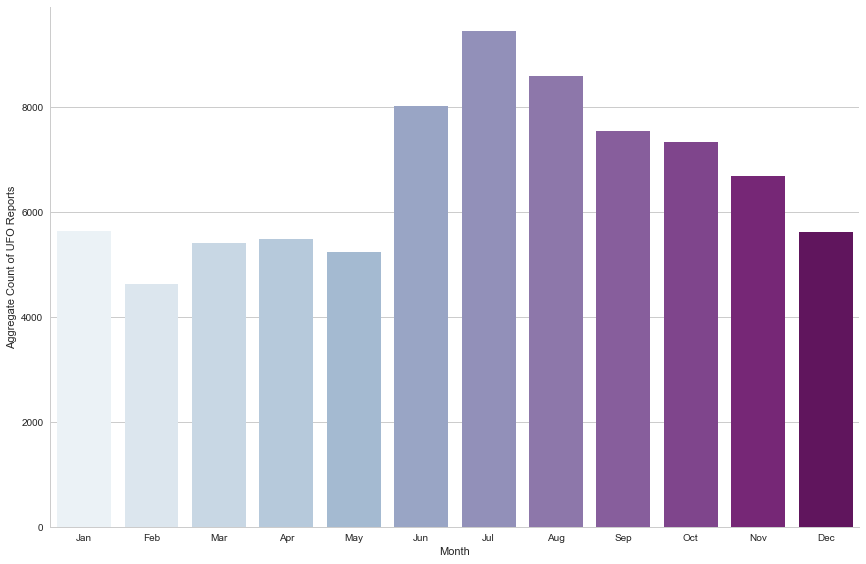

In [20]:
ufos_by_month_df = pd.DataFrame(data=ufos['datetime'].dt.month)
ufos_by_month_df.rename(columns={'datetime': 'Month'}, inplace=True)
months = np.arange(1, 13)
g = sns.factorplot(x="Month", data=ufos_by_month_df, kind="count",
                   palette="BuPu", size=8, aspect=1.5, order=months)
labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
g.set_xticklabels(labels);
g.set(xlabel='Month', ylabel='Aggregate Count of UFO Reports')

<h3 style="background-color:#82CAFF; padding: 5px;">Analysis of Reports by Month</h3>

More sightings were reported in the summer months than at any other time of the year. This could be because UFO sightings usually take place outside, thus people have to *be outside* to see them. Since this data comes mostly from the US, we can assume that more people went outside during the summer months. Thus, it makes sense that more sightings were reported at those times; there were more people outside to observe the night sky.

## Updating Map

In [21]:
years_from_col = np.array(ufos['datetime'].dt.year)
years_from_col[np.isnan(years_from_col)] = 0
years_from_col = np.array(sorted(np.unique(years_from_col)))
years_from_col = years_from_col[np.where( years_from_col > 1940 )]
years_from_col = [int(year) for year in years_from_col]
years = [str(year) for year in years_from_col]

figure = {
    'data': [],
    'layout': {},
    'frames': []
}

figure['layout']['title'] = 'UFO Sightings Throughout the US'
figure['layout']['geo'] = dict(
        scope='usa',
        projection=dict( type='albers usa' ),
        showland = True,
        landcolor = "rgb(250, 250, 250)",
        subunitcolor = "rgb(217, 217, 217)",
        countrycolor = "rgb(217, 217, 217)",
        countrywidth = 0.5,
        subunitwidth = 0.5
)
figure['layout']['sliders'] = {
    'args': [
        'transition', {
            'duration': 400,
            'easing': 'cubic-in-out'
        }
    ],
    'initialValue': '1941',
    'plotlycommand': 'animate',
    'values': years,
    'visible': True
}

figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 500, 'redraw': False},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'quadratic-in-out'}}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]

sliders_dict = {
    'active': 0,
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'Year:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration': 300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0,
    'steps': []
}

year = 1941
year_ufos = ufos[(ufos.datetime.dt.year == year) & (ufos.country == 'us')]
year_ufos.loc[(year_ufos.dur_secs > 9600.0), ('dur_secs')] = 9600.0
frame = {'data': [], 'name': str(year)}
data_dict = dict(
    type = 'scattergeo',
    locationmode = 'USA-states',
    lat = year_ufos['latitude'],
    lon = year_ufos['longitude'],
    mode = 'markers',
    marker = dict( 
        size = .5*np.power(year_ufos['dur_secs'],.4), 
        opacity = 0.7,
        reversescale = True,
        autocolorscale = False,
        symbol = 'dot',
        line = dict(
            width=1,
            color='rgba(102, 102, 102)'
        ),
    )
)
figure['data'].append(data_dict)

for year in years_from_col:
    year_ufos = ufos[(ufos.datetime.dt.year == year) & (ufos.country == 'us')]
    year_ufos.loc[(year_ufos.dur_secs > 9600.0), ('dur_secs')] = 9600.0
    frame = {'data': [], 'name': str(year)}
    data_dict = dict(
        type = 'scattergeo',
        locationmode = 'USA-states',
        lat = year_ufos['latitude'],
        lon = year_ufos['longitude'],
        mode = 'markers',
        marker = dict( 
            size = .5*np.power(year_ufos['dur_secs'],.4), 
            opacity = 0.7,
            reversescale = True,
            autocolorscale = False,
            symbol = 'dot',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
        )
    )
    frame['data'].append(data_dict)
    figure['frames'].append(frame)
    slider_step = {'args': [
            [str(year)],
            {'frame': {'duration': 300, 'redraw': False},
             'mode': 'immediate',
           'transition': {'duration': 300}}
         ],
         'label': str(year),
         'method': 'animate'
    }
    sliders_dict['steps'].append(slider_step)
        
figure['layout']['sliders'] = [sliders_dict]

c:\python35\lib\site-packages\pandas\core\indexing.py:477: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [22]:
pyoff.iplot(figure)